In [1]:
# Processes output file generated by csv like so:
# collectl -sZ -p mnucs001-osd-compute-1-20180909-000000.raw -P --from 6:30 --thru 6:40 > /var/tmp/cpu
#

import re
from datetime import datetime, timedelta
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import matplotlib.backends.backend_pdf
import time


In [17]:
input_csv = 'cpu'
with open(input_csv, 'r') as f:
    content = f.read()
data = []
for r in content.split('\n')[2:]:
    splr = re.split(' +', r)
    if len(splr) > 5:
        cmd = splr[29]
        datetime = splr[0] + ' ' + splr[1]
        cpu = splr[15]
        data.append({
            'datetime': datetime,
            'cmd': cmd,
            'cpu': cpu            
        })
print(data)

[{'datetime': '20180909 06:31:10', 'cmd': '/usr/lib/systemd/systemd', 'cpu': '10'}, {'datetime': '20180909 06:31:10', 'cmd': 'rcu_sched', 'cpu': '2'}, {'datetime': '20180909 06:31:10', 'cmd': 'ksoftirqd/18', 'cpu': '18'}, {'datetime': '20180909 06:31:10', 'cmd': 'kworker/11:1', 'cpu': '11'}, {'datetime': '20180909 06:31:10', 'cmd': 'kworker/16:2', 'cpu': '16'}, {'datetime': '20180909 06:31:10', 'cmd': 'kworker/13:0', 'cpu': '13'}, {'datetime': '20180909 06:31:10', 'cmd': 'kworker/8:1', 'cpu': '8'}, {'datetime': '20180909 06:31:10', 'cmd': 'kworker/21:2', 'cpu': '21'}, {'datetime': '20180909 06:31:10', 'cmd': 'ixgbevf', 'cpu': '13'}, {'datetime': '20180909 06:31:10', 'cmd': 'kworker/0:1', 'cpu': '0'}, {'datetime': '20180909 06:31:10', 'cmd': 'kworker/20:0', 'cpu': '20'}, {'datetime': '20180909 06:31:10', 'cmd': 'kworker/4:2', 'cpu': '4'}, {'datetime': '20180909 06:31:10', 'cmd': 'kworker/5:0', 'cpu': '5'}, {'datetime': '20180909 06:31:10', 'cmd': 'kworker/18:0H', 'cpu': '18'}, {'datetim

In [63]:
df = pd.DataFrame(data)
#df.columns = ['timestamp', 'command', 'cpu']
df['timestamp'] = pd.to_datetime(df['datetime'])
df = df.set_index('timestamp')
df['cpu'] = pd.to_numeric(df['cpu'])
df.sort_values(by=['cpu'], ascending=False)
#df.head()
#df.dtypes


,cmd,cpu,datetime
timestamp,,,
2018-09-09 06:32:10,kworker/27:0,27,20180909 06:32:10
2018-09-09 06:31:10,kworker/27:1H,27,20180909 06:31:10
2018-09-09 06:36:10,/usr/libexec/qemu-kvm,27,20180909 06:36:10
2018-09-09 06:36:10,watchdog/27,27,20180909 06:36:10
2018-09-09 06:36:10,migration/27,27,20180909 06:36:10
2018-09-09 06:36:10,ksoftirqd/27,27,20180909 06:36:10
2018-09-09 06:36:10,kworker/27:0H,27,20180909 06:36:10
2018-09-09 06:39:10,kworker/27:2,27,20180909 06:39:10
2018-09-09 06:32:10,kworker/27:2,27,20180909 06:32:10


/Users/ccrum/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


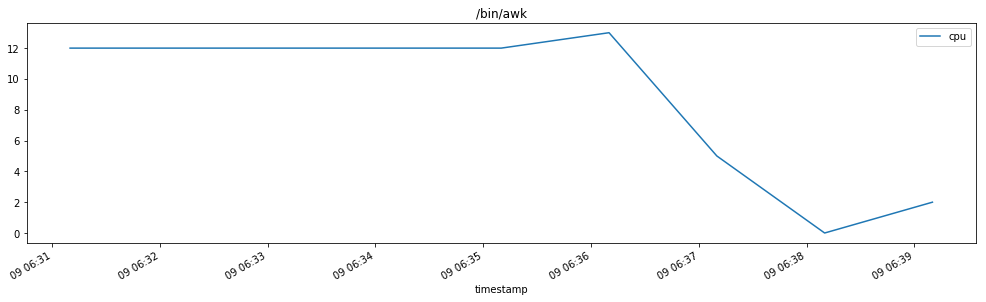

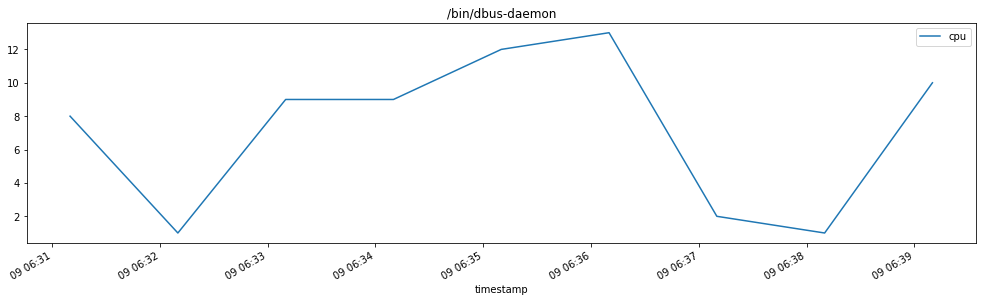

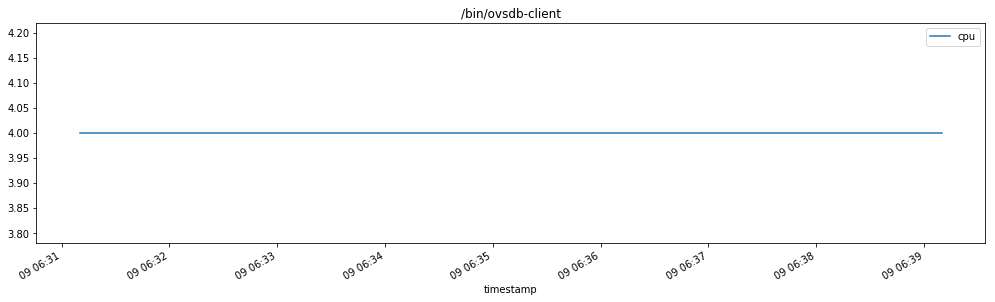

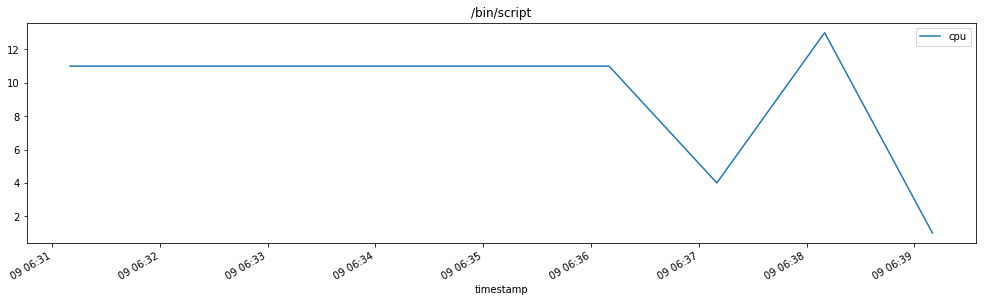

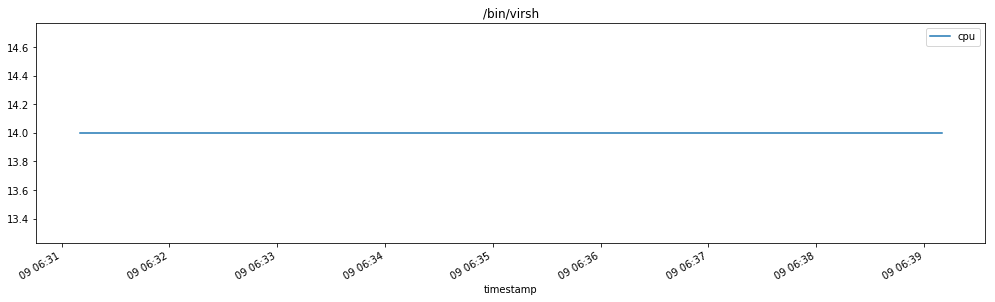

...

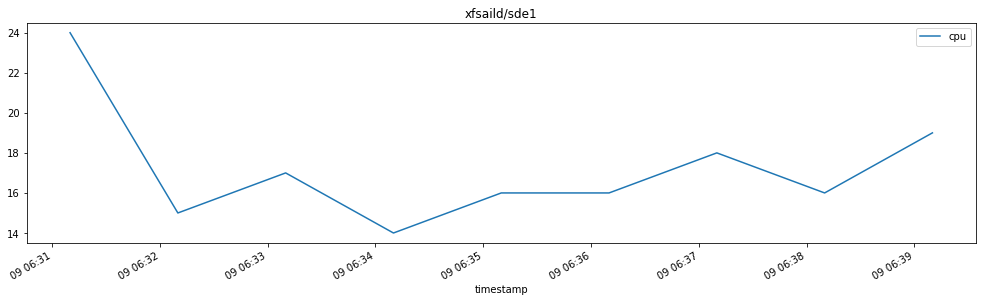

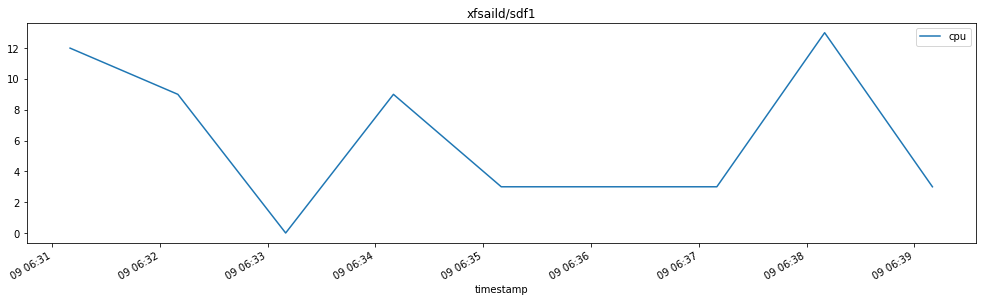

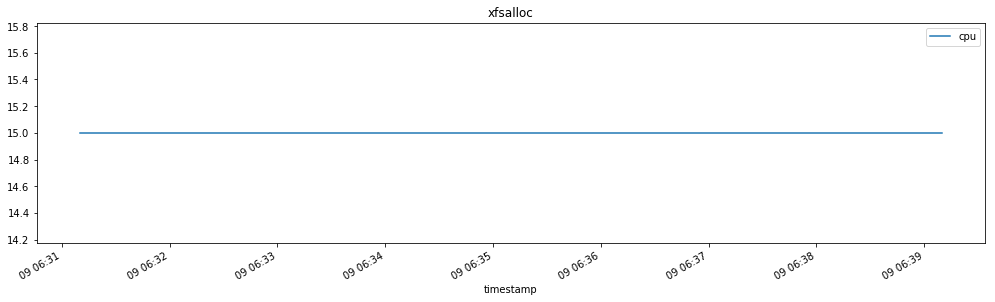

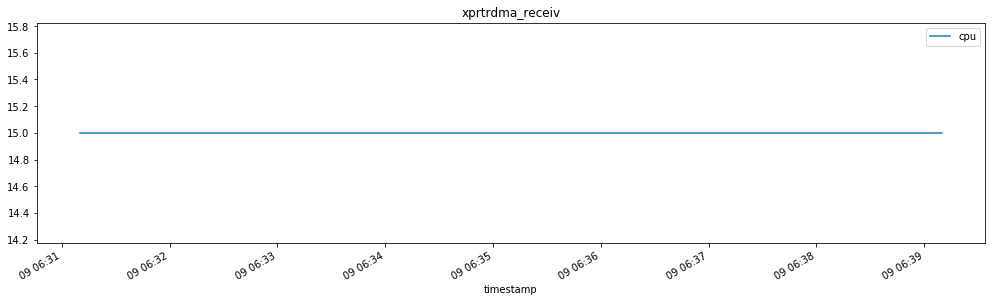

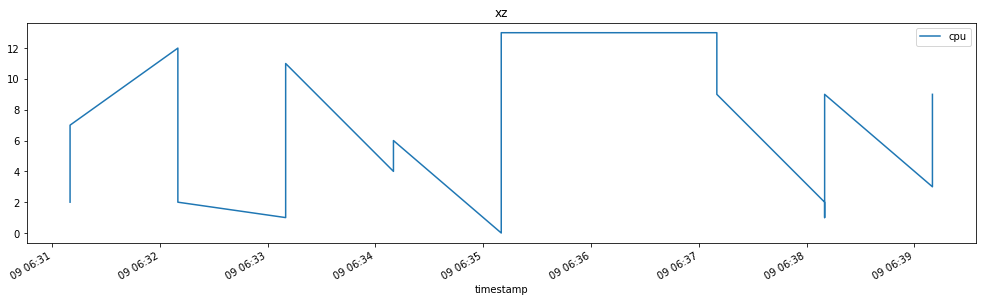

In [58]:
for title, group in df.groupby('cmd'):
    group.plot(y='cpu', title=title, figsize=(17,4.5))

/Users/ccrum/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


cmd
/bin/awk                             AxesSubplot(0.125,0.2;0.775x0.68)
/bin/dbus-daemon                     AxesSubplot(0.125,0.2;0.775x0.68)
/bin/ovsdb-client                    AxesSubplot(0.125,0.2;0.775x0.68)
/bin/script                          AxesSubplot(0.125,0.2;0.775x0.68)
/bin/virsh                           AxesSubplot(0.125,0.2;0.775x0.68)
/sbin/agetty                         AxesSubplot(0.125,0.2;0.775x0.68)
/sbin/auditd                         AxesSubplot(0.125,0.2;0.775x0.68)
/usr/bin/ceph-osd                    AxesSubplot(0.125,0.2;0.775x0.68)
/usr/bin/perl                        AxesSubplot(0.125,0.2;0.775x0.68)
/usr/bin/python                      AxesSubplot(0.125,0.2;0.775x0.68)
/usr/bin/python2                     AxesSubplot(0.125,0.2;0.775x0.68)
/usr/bin/rhsmcertd                   AxesSubplot(0.125,0.2;0.775x0.68)
/usr/bin/sh                          AxesSubplot(0.125,0.2;0.775x0.68)
/usr/lib/polkit-1/polkitd            AxesSubplot(0.125,0.2;0.775x0.68)
/u

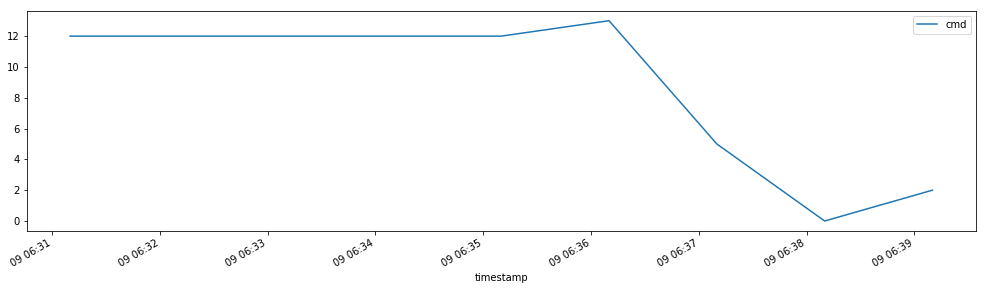

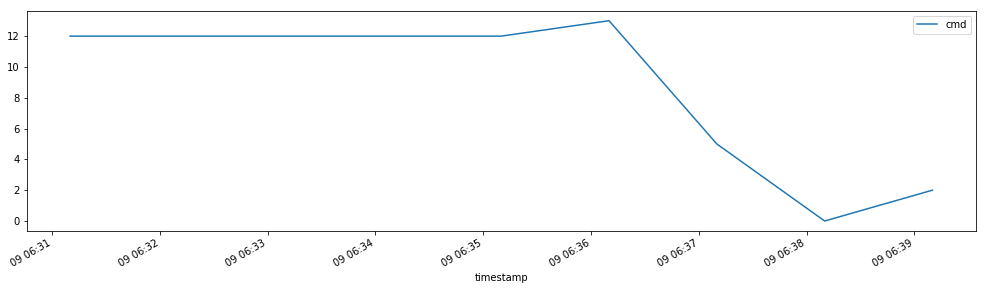

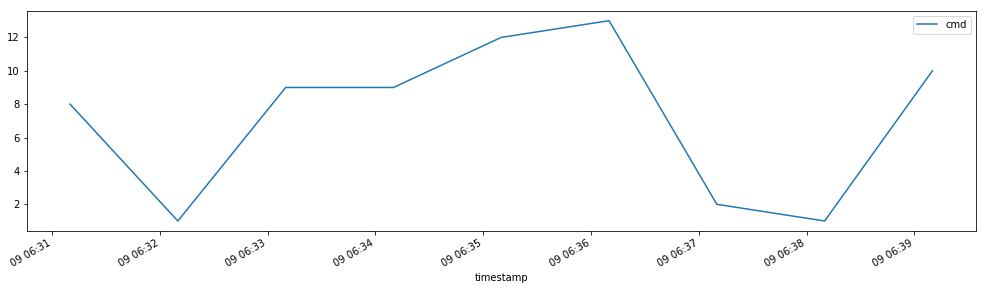

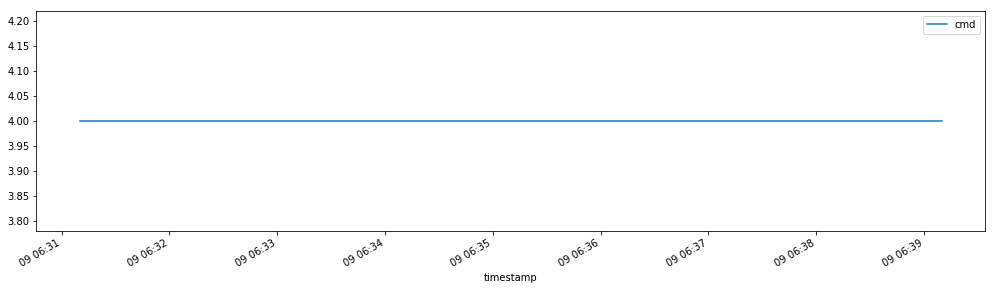

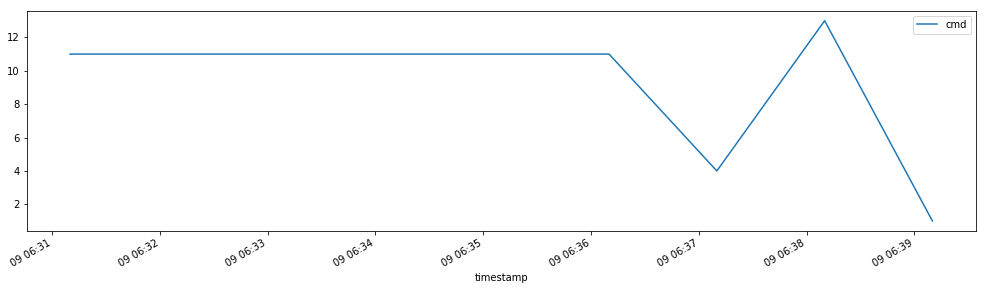

...

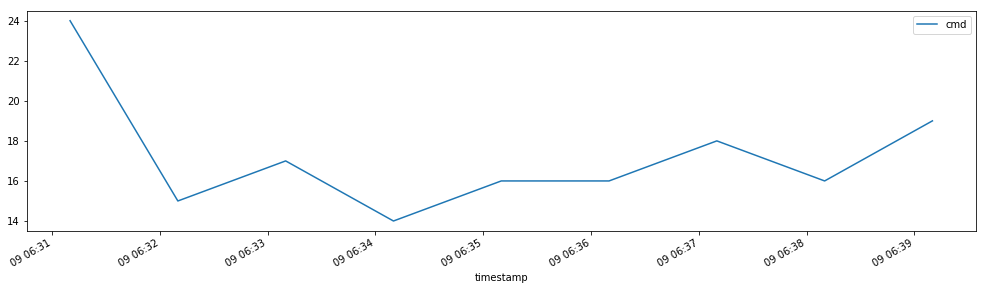

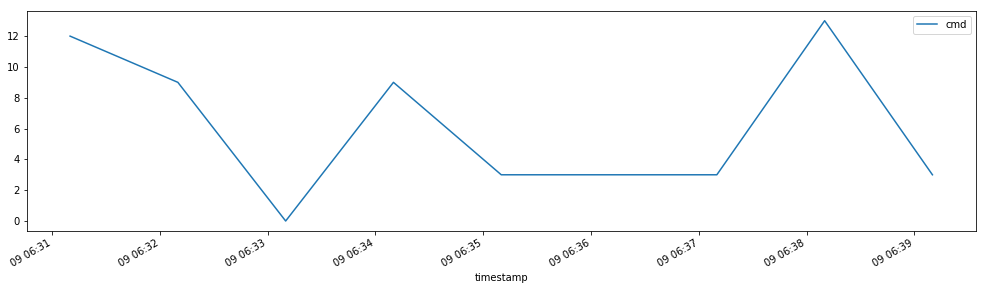

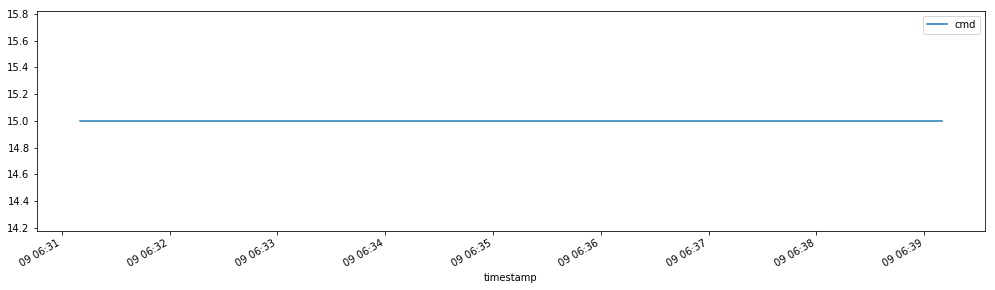

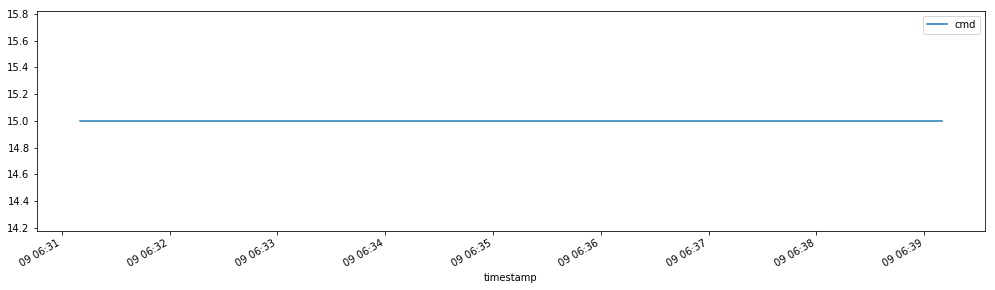

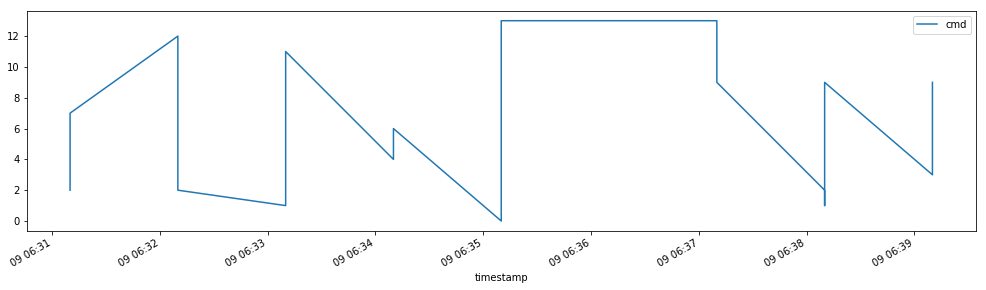

In [52]:

df.groupby('cmd').plot.line(y='cpu', figsize=(17,4.5), legend='reverse', label='cmd')